In [1]:
import preprocess
import visualize
import selection
import relevance
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn import tree
from genetic_selection import GeneticSelectionCV
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
import lime
import lime.lime_tabular
import shap
from lime import submodular_pick
from eli5 import show_weights, show_prediction, explain_weights_dfs, explain_prediction_dfs

import warnings
warnings.filterwarnings("ignore")

In [2]:
# load data for personal internet use disorder
data = preprocess.load_piu_data()
data.head()

,Gender,Achievement,Economic status,Internet Use (in years),Internet Use (hours per week),Internet Use (hours per day),Internet Use (in holiday),Attitude about time on the Internet,Politics,Business,...,Coffee,Alcohol,Drepressive temperament,Cyclothymic temperament,Hyperthymic temperament,Irritable temperament,Anxiety temperament,PIU,PIUcutoff,Cutoff_Class
0,0.0,3.0,3.0,9.0,1.0,1.0,2.0,0.0,5.0,1.0,...,1.0,1.0,0.857143,0.571429,0.500,0.571429,0.714286,NaN,NaN,NaN
1,0.0,4.0,4.0,5.0,0.0,0.0,2.0,0.0,2.0,1.0,...,0.0,0.0,0.285714,0.857143,0.875,0.571429,0.571429,25.0,0.0,0.0
2,0.0,4.0,3.0,9.0,1.0,1.0,1.0,0.0,2.0,3.0,...,0.0,0.0,0.142857,0.142857,1.000,0.142857,0.000000,28.0,0.0,0.0
3,0.0,4.0,3.0,7.0,0.0,0.0,1.0,0.0,1.0,2.0,...,0.0,0.0,0.285714,0.142857,1.000,0.714286,0.428571,31.0,0.0,0.0
4,0.0,4.0,1.0,2.0,0.0,0.0,2.0,0.0,1.0,3.0,...,NaN,0.0,0.428571,0.428571,0.625,0.857143,0.714286,28.0,0.0,0.0


In [3]:
# print column names to check if everything is OK
print(data.columns)

Index(['Gender', 'Achievement', 'Economic status', 'Internet Use (in years)',
       'Internet Use (hours per week)', 'Internet Use (hours per day)',
       'Internet Use (in holiday)', 'Attitude about time on the Internet',
       'Politics', 'Business', 'Sports', 'Computers and technology',
       'Arts and culture', 'Education', 'Pop culture', 'Pornography', 'Music',
       'Travel/tourism', 'Health and medicine', 'Science', 'Religion',
       'Communication by e-mail', 'Social networks',
       'Communication on the forum', 'Communication on the blog',
       'Targeted Internet search', 'Surfing', 'Expert Advice',
       'Search for favorite websites', 'Reading the news', 'Online games',
       'Reading and downloading books and texts',
       'Downloading music and movies', 'Internet for school', 'Online courses',
       'Everyday FB use', 'Average time spent on FB', 'FB use - reading posts',
       'FB use - publishing statuses', 'FB use - sharing music, photos etc.',
       'FB 

In [4]:
# check columns with NaN values
print(data.isna().sum().sort_values(ascending=False))

Cutoff_Class                               104
PIUcutoff                                  104
PIU                                        104
Average time spent on FB                    95
Internet Use (in years)                     91
Sports – in minutes                         86
Internet Use (hours per day)                72
Communication by e-mail                     60
Communication on the blog                   59
Sports – intensity                          55
Online games                                54
Online courses                              54
Pornography                                 53
Communication on the forum                  52
Expert Advice                               49
Reading and downloading books and texts     48
Fast Food                                   46
Religion                                    45
Travel/tourism                              43
Pop culture                                 43
Business                                    43
Computers and

In [5]:
data = preprocess.process_standardization(data)
data.head

<bound method NDFrame.head of       Gender  Achievement  Economic status  Internet Use (in years)  \
0        0.0    -1.366523        -0.389762                 1.528074   
1        0.0    -0.145708         0.564106                -0.237632   
2        0.0    -0.145708        -0.389762                 1.528074   
3        0.0    -0.145708        -0.389762                 0.645221   
4        0.0    -0.145708        -2.297499                -1.561912   
...      ...          ...              ...                      ...   
2108     0.0    -0.145708        -2.297499                -1.561912   
2109     0.0     1.075106        -0.389762                -0.237632   
2110     0.0    -1.366523        -0.389762                -0.237632   
2111     0.0    -0.145708        -2.297499                -1.120486   
2112     0.0    -1.366523         0.564106                -1.120486   

      Internet Use (hours per week)  Internet Use (hours per day)  \
0                               1.0             

In [6]:
# process columns with NaN values
data = preprocess.process_columns_with_nan_values(data)
# check again columns with NaN values
print(data.isna().sum().sort_values(ascending=False))

Gender                                     0
Sports – intensity                         0
Internet for school                        0
Online courses                             0
Everyday FB use                            0
Average time spent on FB                   0
FB use - reading posts                     0
FB use - publishing statuses               0
FB use - sharing music, photos etc.        0
FB use –gaming                             0
FB use – chatting                          0
FB use – visiting groups                   0
Sports – days in a  week                   0
Sports – in minutes                        0
Online games                               0
Energy drinks                              0
Fast Food                                  0
Smoker                                     0
Coffee                                     0
Alcohol                                    0
Drepressive temperament                    0
Cyclothymic temperament                    0
Hyperthymi

In [7]:
data = preprocess.process_outliers(data)

Original number of rows: 2009
Number of normal rows detected: 1908
Number of outliers detected: 101
Number of rows after eliminating outliers: 1908


In [8]:
# predictors and class
x_data = data[data.columns.difference(['Cutoff_Class', 'PIUcutoff', 'PIU' ])]
y_data = data['Cutoff_Class']
# split dataset to training and test sets
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, test_size=0.05, random_state=1234, shuffle=True) #, stratify=y_data)
x_train = x_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
x_test = x_test.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

In [9]:
# prepare data frame to count top features
df_top_features = pd.DataFrame({'attr_names' : x_train.columns.values})
df_top_features['top_count'] = 0
df_top_features['top_count_xai'] = 0
df_top_features['top_count_selection'] = 0

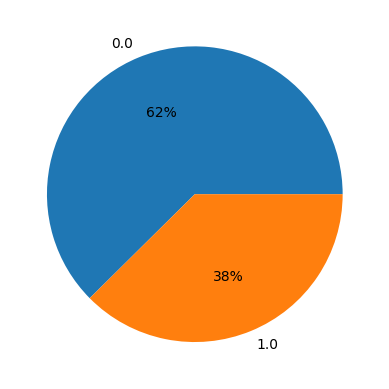

In [10]:
df = pd.DataFrame({'Cutoff_Class':y_train})
visualize.show_value_distribution_per_column(df, 'Cutoff_Class')

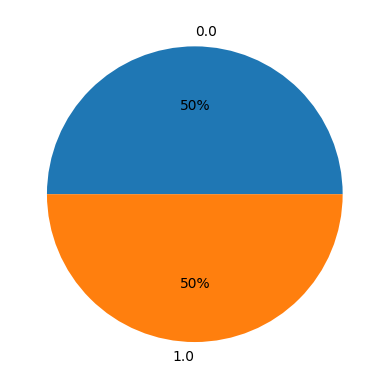

In [11]:
# oversample data
oversampler = SMOTE()
x_train, y_train = oversampler.fit_resample(x_train, y_train)
df = pd.DataFrame({'Cutoff_Class':y_train})
visualize.show_value_distribution_per_column(df, 'Cutoff_Class')

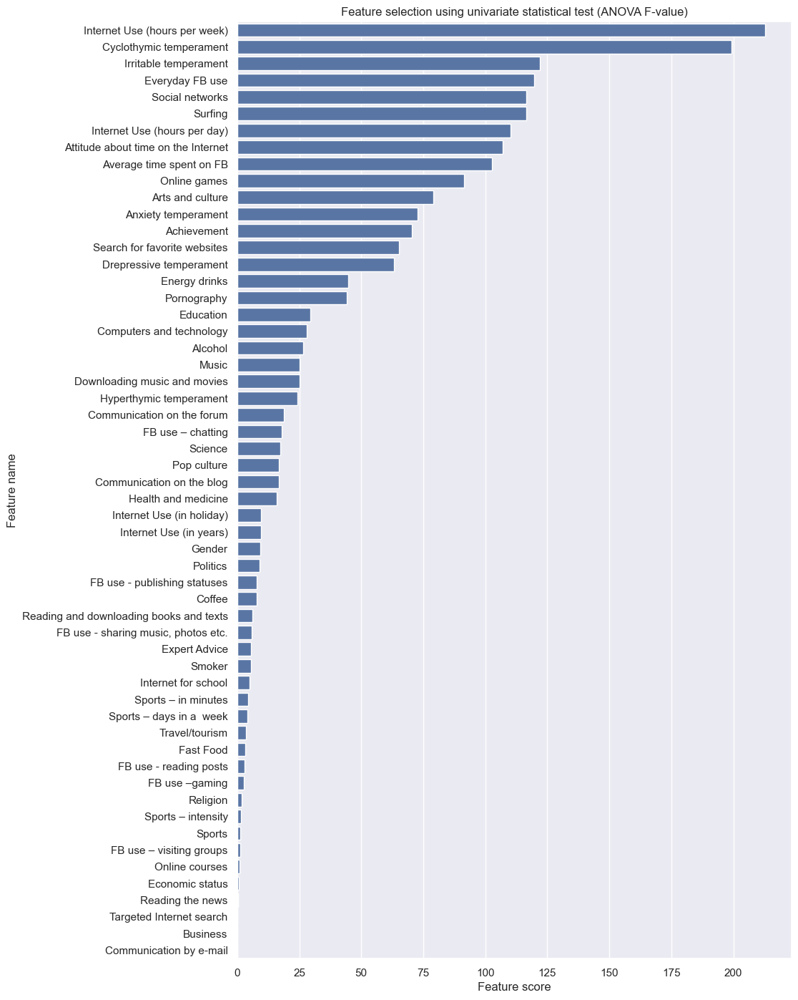

In [12]:
k_features = selection.select_k_best_features(x_train, y_train, 0)
visualize.show_selected_features(
    title = 'Feature selection using univariate statistical test (ANOVA F-value)',
    label_x = 'Feature score',
    label_y = 'Feature name',
    data_x = k_features['values'],
    data_y = k_features['attr_names']
)
df_top_features = relevance.add_top_features_count('select_k_best', df_top_features, k_features, 10)

In [13]:
trained_models = dict()
parameters = dict()
# hyperparameters for decision tree classifier
parameters['decision_tree'] = dict(
    max_leaf_nodes = list(range(2,10)), 
    min_samples_split = [2,3,4],
    max_depth = [2,3,5,10],
    criterion = ['gini', 'entropy']
)
trained_models['decision_tree'] = DecisionTreeClassifier()

# hyperparameters for random forest classifier
parameters['random_forest'] = dict(
    n_estimators = [10,20,40], 
    criterion = ['gini', 'entropy', 'log_loss'],
    # max_features = list(range(3,8)),
    max_depth = [2,4,9]
)
trained_models['random_forest'] = RandomForestClassifier()

# hyperparameters for adaboost classifier
parameters['adaboost'] = dict(
    n_estimators = [10,20,40],
    learning_rate = [0.01,0.1,1],
    algorithm = ['SAMME', 'SAMME.R']
)
trained_models['adaboost'] = AdaBoostClassifier()

# hyperparameters for xgboost classifier
parameters['xgboost'] = dict(
    max_depth = [1,3,5,7,9,11],
    learning_rate = [0.01,0.1,1,10,100],
    subsample = [0.5, 0.7, 1],
    n_estimators = [5,50,70]
)
trained_models['xgboost'] = XGBClassifier()

#hyperparameters for bagging classifier
parameters['bagging'] = dict(
    #n_estimators = [300, 400, 500, 600, 700, 800],
    n_estimators = [300, 600],
    # max_features = [0.90, 0.92, 0.95, 1.0],
    bootstrap = [True, False],
    bootstrap_features = [True, False],
)
trained_models['bagging'] = BaggingClassifier()

# hyperparameters for gradient boosting classifier
parameters['gradient_boosting'] = dict(
    n_estimators = [5,50,70],
    max_depth = [1,3,5,7,9,11],
    learning_rate = [0.01,0.1,1,10,100],
    #loss = ['log_loss', 'exponential'],
    #criterion = ['friedman_mse', 'squared_error']
)
trained_models['gradient_boosting'] = GradientBoostingClassifier()

# train classifier using GridSearchCV for each of the selected models
# print("Not optimizing parameters every time")
# uncomment only to recheck hyperparameter optimization
# for m in trained_models:
#     trained_models[m] = selection.train_best_classifier(m, trained_models[m], parameters[m], x_train, y_train, x_test, y_test)

# instead create models with optimized parameters
trained_models = dict()
trained_models['decision_tree'] = DecisionTreeClassifier(criterion='entropy', max_depth=5, max_leaf_nodes=7)
trained_models['random_forest'] = RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=40)
trained_models['adaboost'] = AdaBoostClassifier(learning_rate=1, n_estimators=40)
trained_models['xgboost'] = XGBClassifier(max_depth=9, learning_rate=0.1, n_estimators=50)
trained_models['bagging'] = BaggingClassifier(bootstrap_features=False, bootstrap=True, n_estimators=600)
trained_models['gradient_boost'] = GradientBoostingClassifier(learning_rate=1, max_depth=11, n_estimators=70)

In [14]:
# compute classification metrics for every classification model
df_models = selection.calculate_classifier_metrics(trained_models, x_train, y_train)
print(df_models)

       Model name  Accuracy  Precision  Recall     F1
0   decision_tree     0.722      0.782   0.620  0.690
1   random_forest     0.782      0.800   0.752  0.774
2        adaboost     0.771      0.767   0.779  0.773
3         xgboost     0.794      0.802   0.781  0.790
4         bagging     0.808      0.826   0.781  0.802
5  gradient_boost     0.800      0.814   0.781  0.796


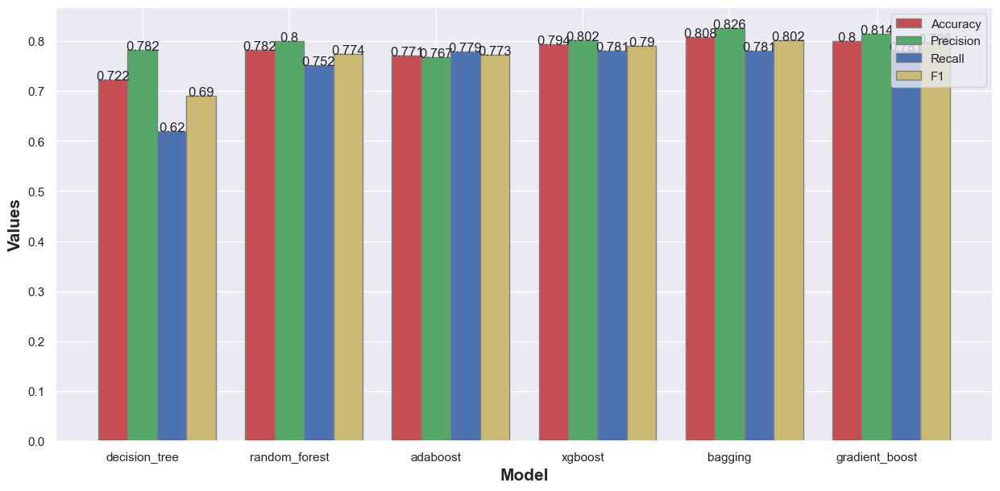

In [15]:
# show metrics for trained models
visualize.show_model_comparasion(df_models)

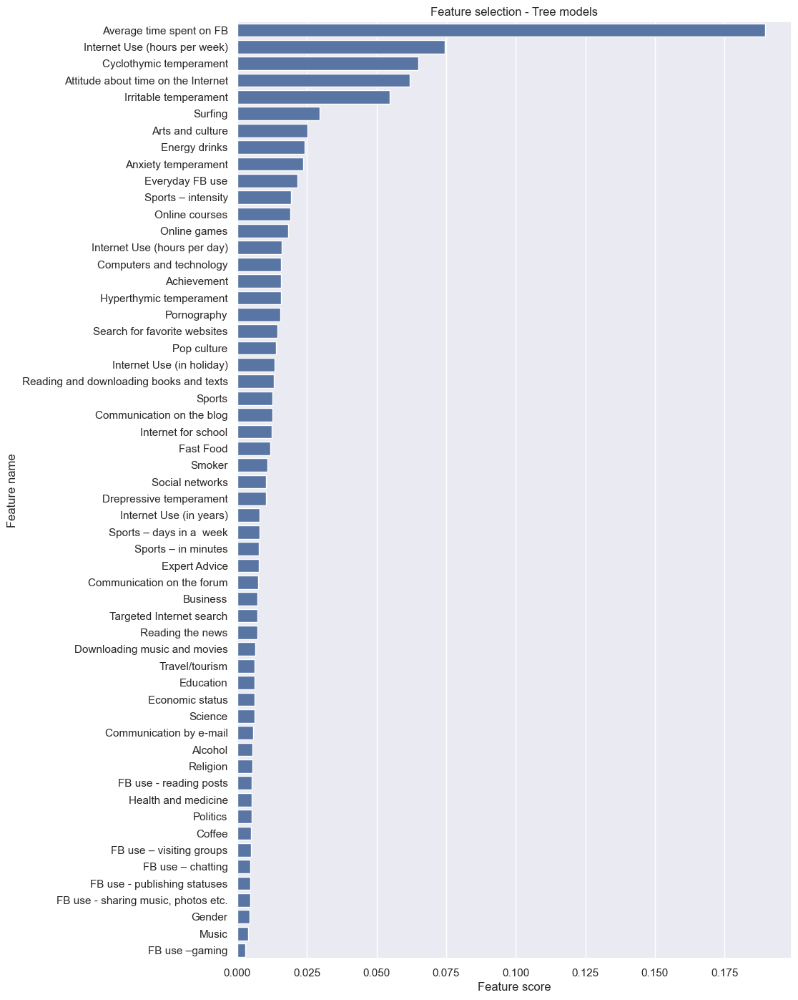

In [16]:
# fit all models with train data
trained_models = dict()
trained_models['decision_tree'] = DecisionTreeClassifier(criterion='entropy', max_depth=5, max_leaf_nodes=7)
trained_models['random_forest'] = RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=40)
trained_models['adaboost'] = AdaBoostClassifier(learning_rate=1, n_estimators=40)
trained_models['xgboost'] = XGBClassifier(max_depth=9, learning_rate=0.1, n_estimators=50)
for m in trained_models:
    trained_models[m].fit(x_train, y_train)
    
df_features = selection.get_feature_importances(trained_models, x_train, y_train)
visualize.show_selected_features(
    title = 'Feature selection - Tree models',
    label_x = 'Feature score',
    label_y = 'Feature name',
    data_x = df_features['values'],
    data_y = df_features['attr_names']
)

df_top_features = relevance.add_top_features_count('tree_importance', df_top_features, df_features, 10)

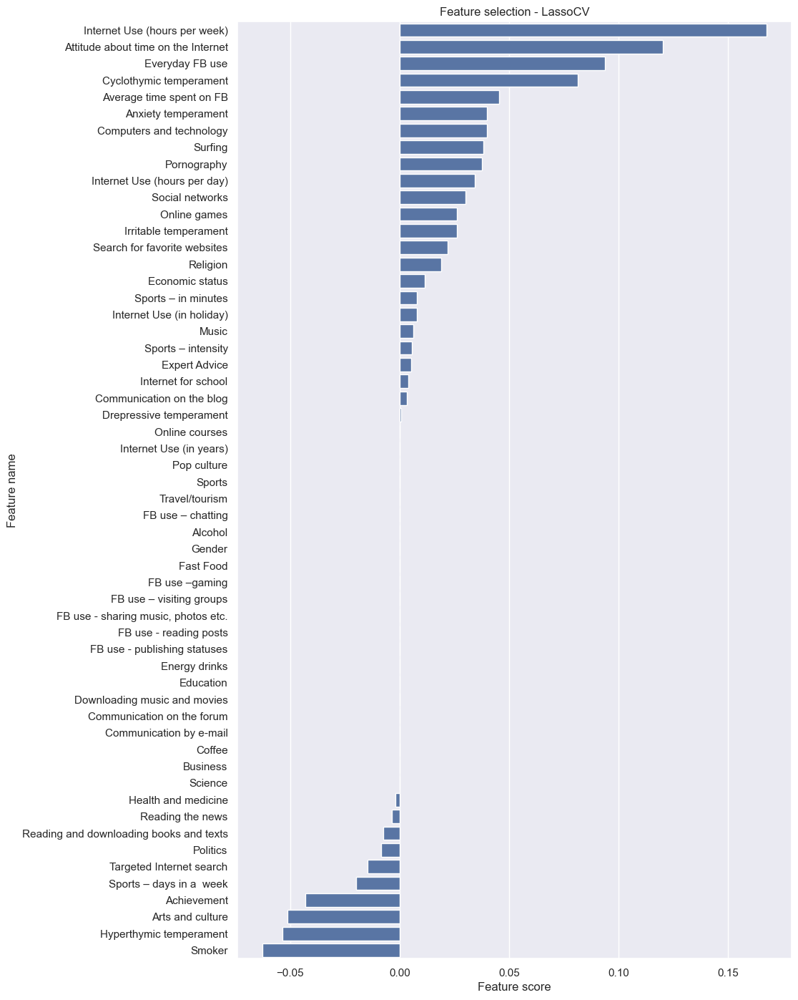

In [17]:
# show features selected by LassoCV
df_features = selection.get_feature_scores_lasso(x_train, y_train)
visualize.show_selected_features(
    title = 'Feature selection - LassoCV',
    label_x = 'Feature score',
    label_y = 'Feature name',
    data_x = df_features['values'],
    data_y = df_features['attr_names']
)
df_top_features = relevance.add_top_features_count('lasso', df_top_features, df_features, 10)

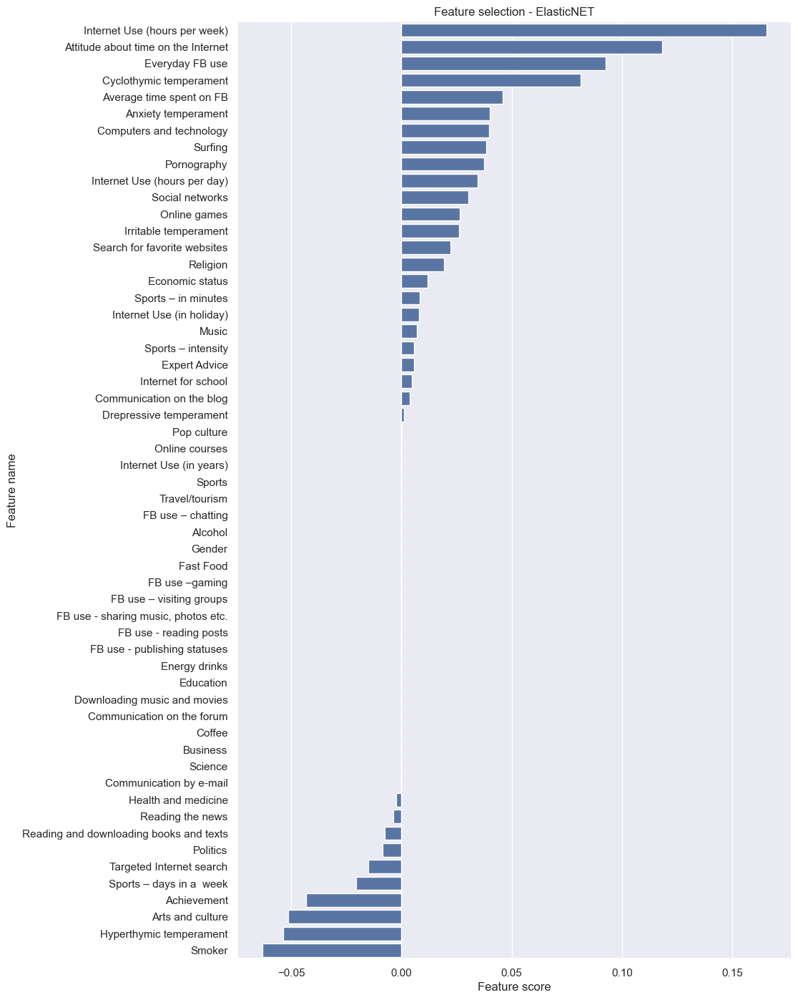

In [18]:
# show features selected by ElasticNET
df_features = selection.get_feature_scores_elenet(x_train, y_train)
visualize.show_selected_features(
    title = 'Feature selection - ElasticNET',
    label_x = 'Feature score',
    label_y = 'Feature name',
    data_x = df_features['values'],
    data_y = df_features['attr_names']
)
df_top_features = relevance.add_top_features_count('elenet', df_top_features, df_features, 10)

In [19]:
# fit one representative model
predictions = relevance.get_predictions('random_forest', x_train, y_train, x_test, y_test)

Train accuracy: 0.97
Test accuracy: 0.74
Confusion Matrix: 
[[45 10]
 [15 26]]

Classification Report:
              precision    recall  f1-score   support

         0.0       0.75      0.82      0.78        55
         1.0       0.72      0.63      0.68        41

    accuracy                           0.74        96
   macro avg       0.74      0.73      0.73        96
weighted avg       0.74      0.74      0.74        96



In [20]:
# feature selection using genetic algorithms
selector = GeneticSelectionCV(
    estimator=predictions['model'],
    cv=10,
    scoring="accuracy",
    n_population=20, #50,
    n_generations=5, #40,
    n_jobs=10,
    verbose=False
)
selector.fit(x_train, y_train)
visualize.show_genetic_selection_results(selector, x_train)

                                   features  is_used
0                               Achievement     True
1                                   Alcohol     True
2                       Anxiety temperament     True
3                          Arts and culture    False
4       Attitude about time on the Internet     True
5                  Average time spent on FB     True
6                                  Business     True
7                                    Coffee     True
8                   Communication by e-mail     True
9                 Communication on the blog     True
10               Communication on the forum     True
11                 Computers and technology    False
12                  Cyclothymic temperament     True
13             Downloading music and movies     True
14                  Drepressive temperament     True
15                          Economic status     True
16                                Education     True
17                            Energy drinks   

In [21]:
# add top features statistics
df_features = pd.DataFrame({'attr_names': x_train.columns.values, 'values':selector.support_})
df_top_features = relevance.add_top_features_count('genetic_selection', df_top_features, df_features, 10)

In [22]:
# fit one representative model and get it's predictions
predictions = relevance.get_predictions('random_forest', x_train, y_train, x_test, y_test)

Train accuracy: 0.97
Test accuracy: 0.74
Confusion Matrix: 
[[46  9]
 [16 25]]

Classification Report:
              precision    recall  f1-score   support

         0.0       0.74      0.84      0.79        55
         1.0       0.74      0.61      0.67        41

    accuracy                           0.74        96
   macro avg       0.74      0.72      0.73        96
weighted avg       0.74      0.74      0.74        96



True positive predictions.

Expected PIU value: 1.0.

Predicted PIU value: 1.0.

{1: [(31, 0.11128951703580371), (4, -0.07341759951466524), (3, -0.05341176289759748), (5, 0.05169847495873944), (48, 0.046315630954042925), (12, 0.03946902747313003), (17, 0.03157528748484642), (46, -0.027174525064780956), (21, -0.024469859196085277), (1, -0.02371051659455407)]}


True negative predictions.

Expected PIU value: 0.0.

Predicted PIU value: 0.0.



False positive predictions.

Expected PIU value: 0.0.

Predicted PIU value: 1.0.



False negative predictions.

Expected PIU value: 1.0.

Predicted PIU value: 0.0.



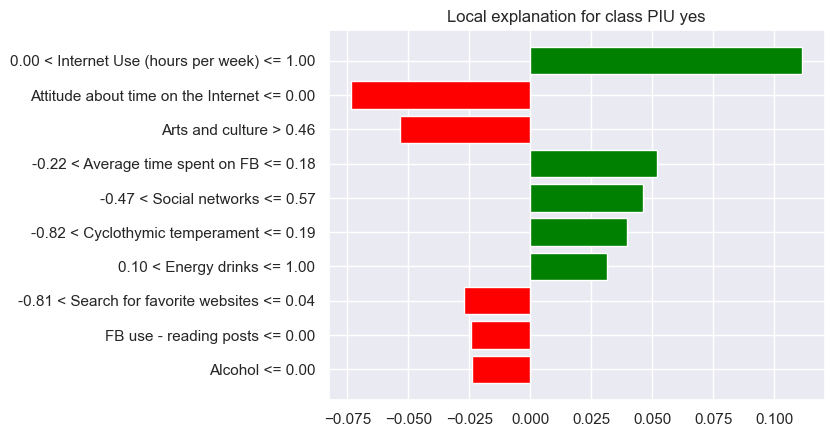

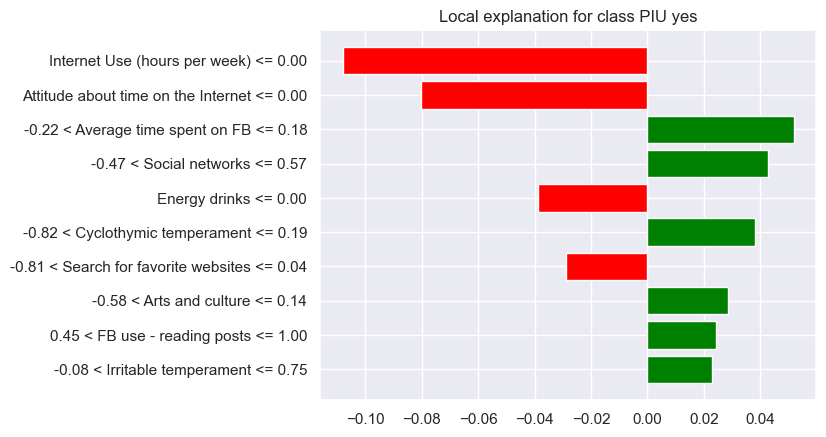

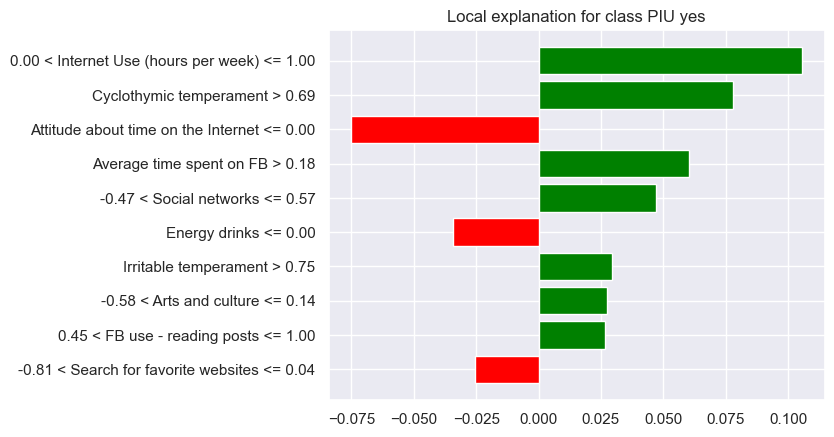

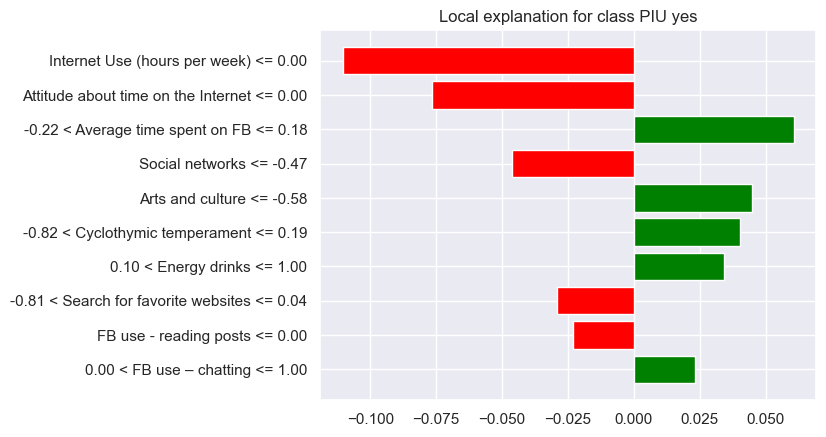

In [23]:
# use LIME to explain results for a single prediction
explainer = lime.lime_tabular.LimeTabularExplainer(
    x_train.values, 
    feature_names=x_test.columns.values.tolist(),
    class_names=['PIU no', 'PIU yes'], 
    verbose=False, 
    mode='classification'
)

predict_fn = lambda x: predictions['model'].predict_proba(x)

print('True positive predictions.\n')
i = predictions['tp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))
exp = explainer.explain_instance(
    x_test.loc[i, x_test.columns.values.tolist()].astype(int).values, 
    predict_fn, 
    num_features=10
)
map = exp.as_map()
print(map)
exp.show_in_notebook(show_table=True)
figure = exp.as_pyplot_figure(label = exp.available_labels()[0])

print('True negative predictions.\n')
i = predictions['tn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))
exp = explainer.explain_instance(
    x_test.loc[i, x_test.columns.values.tolist()].astype(int).values, 
    predict_fn, 
    num_features=10
)
exp.show_in_notebook(show_table=True)
figure = exp.as_pyplot_figure(label = exp.available_labels()[0])

print('False positive predictions.\n')
i = predictions['fp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))
exp = explainer.explain_instance(
    x_test.loc[i, x_test.columns.values.tolist()].astype(int).values, 
    predict_fn, 
    num_features=10
)
exp.show_in_notebook(show_table=True)
figure = exp.as_pyplot_figure(label = exp.available_labels()[0])

print('False negative predictions.\n')
i = predictions['fn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))
exp = explainer.explain_instance(
    x_test.loc[i, x_test.columns.values.tolist()].astype(int).values, 
    predict_fn, 
    num_features=10
)
exp.show_in_notebook(show_table=True)
figure = exp.as_pyplot_figure(label = exp.available_labels()[0])

SP-LIME Explanations.
SP-LIME Local Explanations


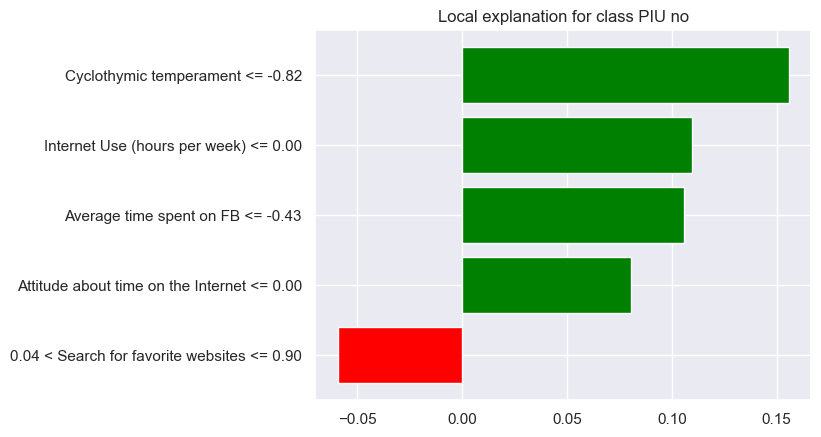

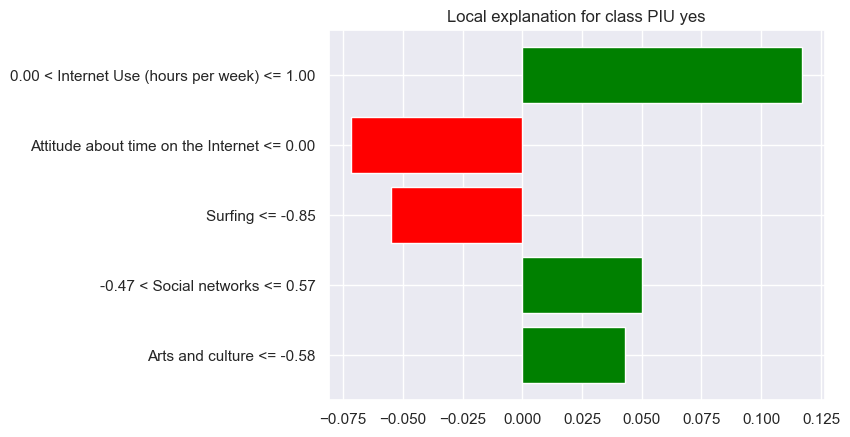

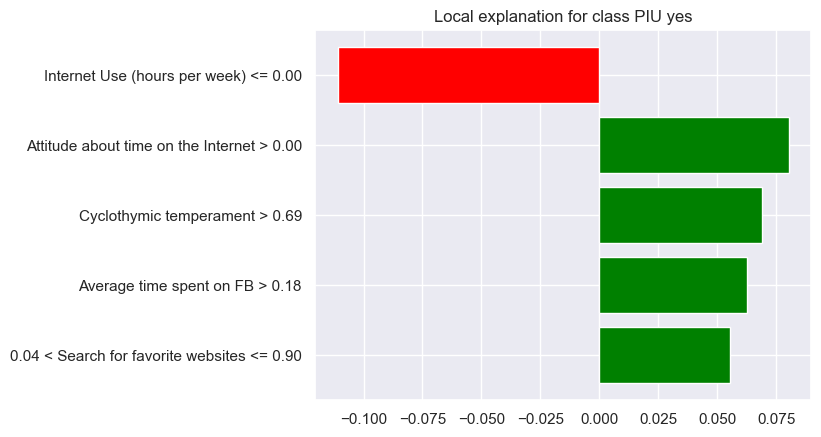

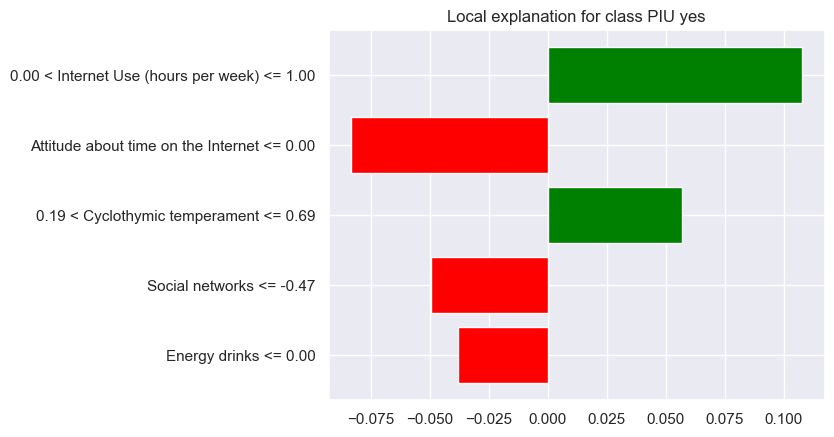

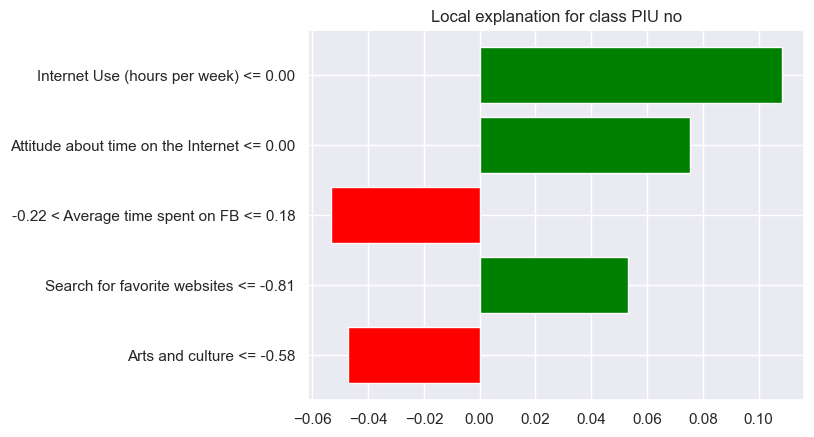

In [24]:
# Let's use SP-LIME to return explanations on a sample data set 
# and obtain a non-redundant global decision perspective of the black-box model
sp_exp = submodular_pick.SubmodularPick(explainer, 
                                        x_test[x_test.columns.values.tolist()].values,
                                        predict_fn, 
                                        num_features=5,
                                        num_exps_desired=5
                                       )
[exp.show_in_notebook() for exp in sp_exp.sp_explanations]
print('SP-LIME Explanations.')
[exp.as_pyplot_figure(label=exp.available_labels()[0]) for exp in sp_exp.sp_explanations]
print('SP-LIME Local Explanations')

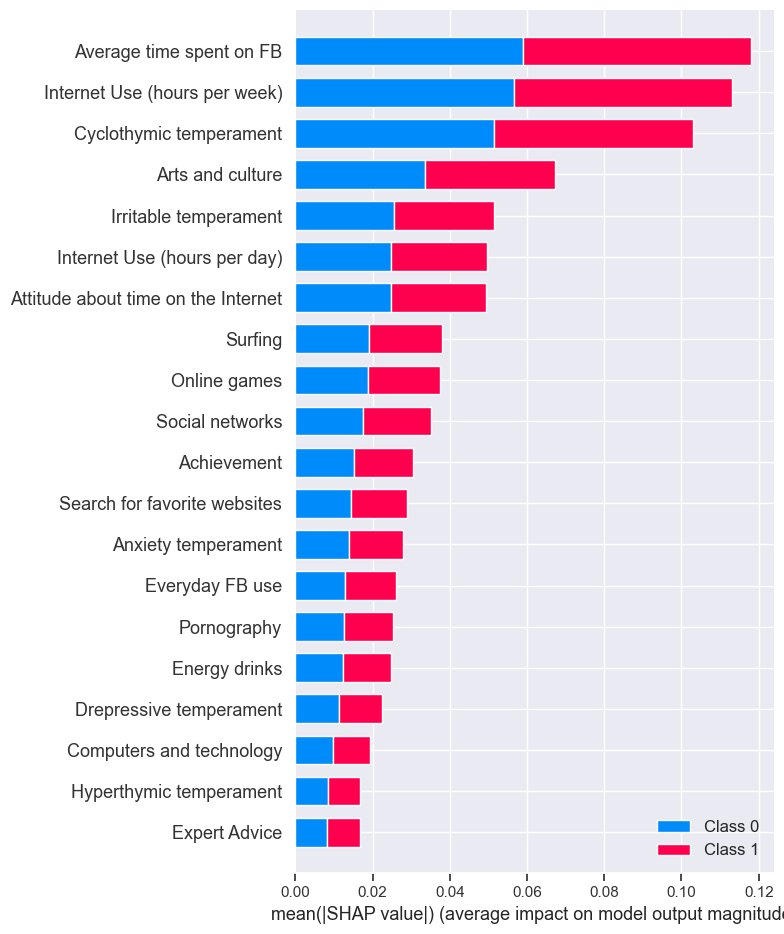

In [25]:
# creating SHAP explainer
explainer = shap.TreeExplainer(predictions['model'])
shap_values = explainer.shap_values(x_train)
# show summary plot of global features relevance 
shap.initjs()
shap.summary_plot(shap_values, x_train)

In [26]:
# add top features statistics
df = relevance.get_shap_values_as_data_frame(x_train, shap_values)
print(df)
df_top_features = relevance.add_top_features_count('SHAP', df_top_features, k_features, 10)
df = relevance.get_shap_values_as_data_frame(x_train, shap_values, 0)
print(df)
df = relevance.get_shap_values_as_data_frame(x_train, shap_values, 1)
print(df)

                                 attr_names    values
1                  Average time spent on FB  0.118057
2             Internet Use (hours per week)  0.113004
3                   Cyclothymic temperament  0.102898
4                          Arts and culture  0.067168
5                     Irritable temperament  0.051360
6              Internet Use (hours per day)  0.049661
7       Attitude about time on the Internet  0.049350
8                                   Surfing  0.038018
9                              Online games  0.037523
10                          Social networks  0.035075
11                              Achievement  0.030403
12             Search for favorite websites  0.028973
13                      Anxiety temperament  0.028000
14                          Everyday FB use  0.025982
15                              Pornography  0.025213
16                            Energy drinks  0.024699
17                  Drepressive temperament  0.022546
18                 Computers

In [27]:
# plot explanations for single instance predictions
print('True positive predictions.\n')
i = predictions['tp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], x_test.iloc[i,:])

True positive predictions.

Expected PIU value: 1.0.

Predicted PIU value: 1.0.



In [28]:
print('True negative predictions.\n')
i = predictions['tn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0,:], x_test.iloc[i,:])

True negative predictions.

Expected PIU value: 0.0.

Predicted PIU value: 0.0.



In [29]:
print('False positive predictions.\n')
i = predictions['fp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][0,:], x_test.iloc[i,:])

False positive predictions.

Expected PIU value: 0.0.

Predicted PIU value: 1.0.



In [30]:
print('False negative predictions.\n')
i = predictions['fn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], x_test.iloc[i,:])

False negative predictions.

Expected PIU value: 1.0.

Predicted PIU value: 0.0.



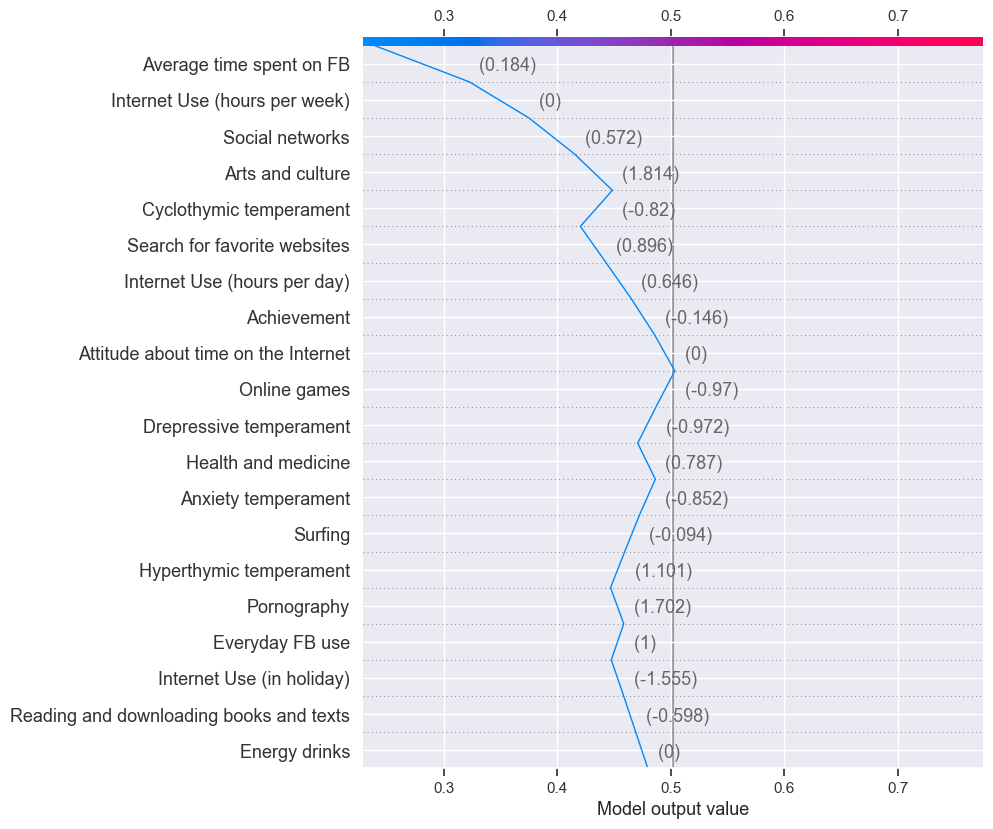

In [31]:
shap.initjs()
shap.decision_plot(explainer.expected_value[1], shap_values[1][0,:], x_train.iloc[3,:])

In [32]:
# use eli5 (permutation feature importance) to show global feature relevance
show_weights(
    predictions['model'], 
    targets=[0, 1], 
    target_names=['PIU no', 'PIU yes'],
    feature_names=x_train.columns.values.tolist(),
    top=len(x_train.columns)+1
)

Weight,Feature
0.0774 ± 0.0903,Average time spent on FB
0.0651 ± 0.0584,Cyclothymic temperament
0.0578 ± 0.0813,Internet Use (hours per week)
0.0366 ± 0.0359,Irritable temperament
0.0344 ± 0.0477,Arts and culture
0.0281 ± 0.0452,Online games
0.0280 ± 0.0537,Attitude about time on the Internet
0.0274 ± 0.0299,Anxiety temperament
0.0272 ± 0.0305,Surfing
0.0252 ± 0.0425,Internet Use (hours per day)


In [33]:
# add top features statistics
df = explain_weights_dfs(
    predictions['model'], 
    targets=[0, 1], 
    target_names=['PIU no', 'PIU yes'],
    feature_names=x_train.columns.values.tolist(),
    top=len(x_train.columns)+1
)
df = pd.DataFrame({'attr_names' : df['feature_importances'].iloc[:, 0], 'values' : df['feature_importances'].iloc[:, 1]})
df_top_features = relevance.add_top_features_count('eli5', df_top_features, k_features, 10)

In [34]:
# plot explanations for single instance predictions
print('True positive predictions.\n')
i = predictions['tp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

show_prediction(
    predictions['model'],
    x_test.iloc[i,:],
    targets=[0, 1], 
    target_names=['PIU no', 'PIU yes'],
    feature_names=x_test.columns.values.tolist(),
    top=(10, 10)
)

True positive predictions.

Expected PIU value: 1.0.

Predicted PIU value: 1.0.



In [35]:
print('True negative predictions.\n')
i = predictions['tn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

show_prediction(
    predictions['model'],
    x_test.iloc[i,:],
    targets=[0, 1], 
    target_names=['PIU no', 'PIU yes'],
    feature_names=x_test.columns.values.tolist(),
    top=len(x_test.columns)+1
)

True negative predictions.

Expected PIU value: 0.0.

Predicted PIU value: 0.0.



In [36]:
print('False positive predictions.\n')
i = predictions['fp'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

show_prediction(
    predictions['model'],
    x_test.iloc[i,:],
    targets=[0, 1], 
    target_names=['PIU no', 'PIU yes'],
    feature_names=x_test.columns.values.tolist(),
    top=len(x_test.columns)+1
)

False positive predictions.

Expected PIU value: 0.0.

Predicted PIU value: 1.0.



In [37]:
print('False negative predictions.\n')
i = predictions['fn'][0][0]
print('Expected PIU value: {}.\n'.format(y_test[i]))
print('Predicted PIU value: {}.\n'.format(predictions['predicted_values']['Predicted'][i]))

show_prediction(
    predictions['model'],
    x_test.iloc[i,:],
    targets=[0, 1], 
    target_names=['PIU no', 'PIU yes'],
    feature_names=x_test.columns.values.tolist(),
    top=len(x_test.columns)+1
)

False negative predictions.

Expected PIU value: 1.0.

Predicted PIU value: 0.0.



In [38]:
# show statistics for features in top_n features of different methods
df_top_features = df_top_features.sort_values(by=['top_count_xai'],ascending=False)
print(df_top_features)

                                 attr_names  top_count  top_count_xai  \
31            Internet Use (hours per week)          6              3   
4       Attitude about time on the Internet          6              3   
5                  Average time spent on FB          6              3   
53                                  Surfing          4              3   
18                          Everyday FB use          6              3   
35                    Irritable temperament          4              3   
12                  Cyclothymic temperament          6              3   
30             Internet Use (hours per day)          4              2   
48                          Social networks          3              2   
38                             Online games          3              2   
2                       Anxiety temperament          3              1   
3                          Arts and culture          4              1   
17                            Energy drinks        

In [39]:
df_top_features = df_top_features.sort_values(by=['top_count'],ascending=False)
print(df_top_features)

                                 attr_names  top_count  top_count_xai  \
31            Internet Use (hours per week)          6              3   
5                  Average time spent on FB          6              3   
18                          Everyday FB use          6              3   
12                  Cyclothymic temperament          6              3   
4       Attitude about time on the Internet          6              3   
3                          Arts and culture          4              1   
53                                  Surfing          4              3   
35                    Irritable temperament          4              3   
30             Internet Use (hours per day)          4              2   
47                                   Smoker          3              0   
38                             Online games          3              2   
2                       Anxiety temperament          3              1   
48                          Social networks        

In [41]:
df_top_features = df_top_features.sort_values(by=['top_count_selection'],ascending=False)
print(df_top_features)

                                 attr_names  top_count  top_count_xai  \
31            Internet Use (hours per week)          6              3   
18                          Everyday FB use          6              3   
12                  Cyclothymic temperament          6              3   
4       Attitude about time on the Internet          6              3   
3                          Arts and culture          4              1   
5                  Average time spent on FB          6              3   
47                                   Smoker          3              0   
30             Internet Use (hours per day)          4              2   
2                       Anxiety temperament          3              1   
29                  Hyperthymic temperament          2              0   
0                               Achievement          2              0   
11                 Computers and technology          1              0   
34                      Internet for school        

In [40]:
# calcualate statistics of important features for correctly classified instances
top_n_features = ['Internet Use (hours per week)', 
'Average time spent on FB',
'Cyclothymic temperament',
'Attitude about time on the Internet',
'Irritable temperament',
'Surfing',
'Everyday FB use',
'Internet Use (hours per day)',
'Social networks',
'Depressive temperament'
]

relevance.get_important_features_statistics(predictions, x_test, top_n_features)


                            attr_names  score
0        Internet Use (hours per week)     23
1             Average time spent on FB     22
2              Cyclothymic temperament     22
7         Internet Use (hours per day)     18
8                      Social networks     16
4                Irritable temperament     10
5                              Surfing     10
3  Attitude about time on the Internet      3
6                      Everyday FB use      2
9               Depressive temperament      0
Number of tp instances 25.00. Mean number of relevant features per classification result 5.04.
                            attr_names  score
0        Internet Use (hours per week)     34
7         Internet Use (hours per day)     33
1             Average time spent on FB     29
2              Cyclothymic temperament     25
4                Irritable temperament     24
8                      Social networks     24
3  Attitude about time on the Internet     21
5                              